In [1]:
# ========== DOWNLOADING DATA FROM KAGGLE ==========

!pip install --upgrade kaggle torch torchvision scikit-learn matplotlib pandas pillow tqdm diffusers transformers accelerate torchmetrics
!pip install torchmetrics[image]
!pip install torch-fidelity

from google.colab import drive
drive.mount('/content/drive')

from google.colab import files
files.upload()  # wrzuć kaggle.json

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!mkdir -p ./data
!kaggle datasets download -d borhanitrash/cat-dataset -p ./data
!kaggle competitions download -c dogs-vs-cats -p ./data

!unzip -q ./data/cat-dataset.zip    -d ./data/cats-only
!unzip -q ./data/dogs-vs-cats.zip   -d ./data/mixed
!unzip -q ./data/mixed/train.zip    -d ./data/mixed/train
!unzip -q ./data/mixed/test1.zip    -d ./data/mixed/test

  Using cached torch_fidelity-0.3.0-py3-none-any.whl.metadata (2.0 kB)
Using cached torch_fidelity-0.3.0-py3-none-any.whl (37 kB)
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/borhanitrash/cat-dataset
License(s): MIT
cat-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
dogs-vs-cats.zip: Skipping, found more recently modified local copy (use --force to force download)
replace ./data/cats-only/cats/Data/cat_0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
replace ./data/mixed/sampleSubmission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
replace ./data/mixed/train/train/cat.0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [3]:
import math, torch, shutil, datetime
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.utils as vutils
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from pathlib import Path
import torchvision.transforms.functional as TF
from torcheval.metrics import FrechetInceptionDistance


BATCH_SIZE = 16; IMAGE_SIZE = 128; EPOCHS = 50
LEARNING_RATE = 2e-4; TIMESTEPS = 400
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
FID_CALCULATION_FREQUENCY = 5 # FID frequency: every 5 epochs

EXPERIMENT_MODE = "DOGS_AND_CATS" # "CATS_ONLY" or "DOGS_AND_CATS"
ROOT_DIR = "/content/cats-only" if EXPERIMENT_MODE == "CATS_ONLY" else "/content/data/mixed/train"
print(f"Starting experiment: '{EXPERIMENT_MODE}' on dataset: {ROOT_DIR}")

Starting experiment: 'DOGS_AND_CATS' on dataset: /content/data/mixed/train


In [ ]:
def make_square(img, size):
    w, h = img.size; s = size / max(w, h); nw, nh = int(w*s), int(h*s)
    img = img.resize((nw, nh), Image.Resampling.BICUBIC)
    pw, ph = size - nw, size - nh

    return TF.pad(img, (pw//2, ph//2, pw-(pw//2), ph-(ph//2)), 0, 'reflect')
transform = transforms.Compose([transforms.Lambda(lambda img: make_square(img, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(), transforms.ToTensor(), transforms.Normalize((0.5,)*3, (0.5,)*3)])

class CustomImageDataset(Dataset):
    def __init__(self, root, transform=None):
        self.paths = list(Path(root).glob("**/*.jpg")); self.transform = transform
        print(f"Found {len(self.paths)} images in '{root}'")

    def __len__(self): return len(self.paths)

    def __getitem__(self, idx):
        return self.transform(Image.open(self.paths[idx]).convert("RGB"))


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim): super().__init__(); self.dim = dim

    def forward(self, time):
        device = time.device; half_dim = self.dim // 2; embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]; return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, dropout=0.1):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1); self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.norm1 = nn.GroupNorm(8, out_ch); self.norm2 = nn.GroupNorm(8, out_ch); self.dropout = nn.Dropout(dropout)
        self.skip = nn.Conv2d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()

    def forward(self, x, time_emb):
        h = self.conv1(x)
        h = self.norm1(h)
        h = F.silu(h)
        h = h + self.time_mlp(time_emb)[:, :, None, None]
        h = self.conv2(h)
        h = self.norm2(h)
        h = self.dropout(h)
        h = F.silu(h); return h + self.skip(x)

class AttentionBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.norm = nn.GroupNorm(8, channels)
        self.qkv = nn.Conv2d(channels, channels * 3, 1)
        self.proj = nn.Conv2d(channels, channels, 1)

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x)
        qkv = self.qkv(h).view(B, 3, C, H * W)
        q, k, v = qkv.unbind(dim=1)
        scale = 1 / math.sqrt(C)
        attn = torch.softmax(torch.einsum('bci,bcj->bij', q, k) * scale, dim=-1)
        h = torch.einsum('bij,bcj->bci', attn, v).view(B, C, H, W)
        
        return x + self.proj(h)


class UNet(nn.Module):

    def __init__(self, in_ch=3, out_ch=3, time_emb_dim=256, ch_mults=(1, 2, 4)):
        super().__init__()
        self.time_embedding = SinusoidalPositionEmbeddings(time_emb_dim)
        self.time_mlp = nn.Sequential(nn.Linear(time_emb_dim, time_emb_dim), nn.SiLU(), nn.Linear(time_emb_dim, time_emb_dim))
        self.conv_in = nn.Conv2d(in_ch, 64, 3, padding=1); self.down_blocks = nn.ModuleList(); self.up_blocks = nn.ModuleList()
        skip_channels, ch = [], 64

        for i, mult in enumerate(ch_mults):
            out = 64 * mult; self.down_blocks.append(nn.ModuleList([ResBlock(ch, out, time_emb_dim), ResBlock(out, out, time_emb_dim),
                AttentionBlock(out) if i >= 1 else nn.Identity(), nn.Conv2d(out, out, 3, stride=2, padding=1)])); ch = out; skip_channels.append(ch)
        self.mid_block1 = ResBlock(ch, ch, time_emb_dim); self.mid_attn = AttentionBlock(ch); self.mid_block2 = ResBlock(ch, ch, time_emb_dim)

        for i, mult in enumerate(reversed(ch_mults)):
            out = 64 * mult; self.up_blocks.append(nn.ModuleList([nn.ConvTranspose2d(ch, out, 4, 2, 1), ResBlock(out + skip_channels.pop(), out, time_emb_dim),
                ResBlock(out, out, time_emb_dim), AttentionBlock(out) if i <= 1 else nn.Identity()])); ch = out
        self.conv_out = nn.Sequential(nn.GroupNorm(8, ch), nn.SiLU(), nn.Conv2d(ch, 3, 3, padding=1))

    def forward(self, x, time):
        t = self.time_mlp(self.time_embedding(time))
        h, skips = self.conv_in(x), []
        for res1, res2, attn, down in self.down_blocks: h = res1(h, t)
        h = res2(h, t)
        h = attn(h)
        skips.append(h)
        h = down(h)
        h = self.mid_block1(h, t) 
        h = self.mid_attn(h) 
        h = self.mid_block2(h, t)
        for up, res1, res2, attn in self.up_blocks: 
            h = up(h)
            h = torch.cat([h, skips.pop()], dim=1) 
            h = res1(h, t) 
            h = res2(h, t) 
            h = attn(h)

        return self.conv_out(h)


class DDPM:
    def __init__(self, model, timesteps=1000, beta_start=1e-4, beta_end=0.02, device='cpu'):
        self.model, self.timesteps, self.device = model, timesteps, device; self.betas = torch.linspace(beta_start, beta_end, timesteps, device=device)
        self.alphas = 1.0 - self.betas; self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.alphas_cumprod_prev = F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0); self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod); self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - self.alphas_cumprod)
        self.posterior_variance = self.betas * (1. - self.alphas_cumprod_prev) / (1. - self.alphas_cumprod)

    def q_sample(self, x_start, t, noise=None):
        if noise is None: 
            noise = torch.randn_like(x_start)

        return (self.sqrt_alphas_cumprod[t].view(-1, 1, 1, 1) * x_start + self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1) * noise)

    def p_losses(self, x_start, t, noise=None):
        if noise is None: 
            noise = torch.randn_like(x_start)

        return F.mse_loss(noise, self.model(self.q_sample(x_start=x_start, t=t, noise=noise), t))

    @torch.no_grad()
    def p_sample(self, x, t, t_index):
        betas_t = self.betas[t].view(-1, 1, 1, 1) 
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alphas_t = self.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alphas_t * (x - betas_t * self.model(x, t) / sqrt_one_minus_alphas_cumprod_t)
        if t_index == 0: 
            return model_mean

        return model_mean + torch.sqrt(self.posterior_variance[t].view(-1, 1, 1, 1)) * torch.randn_like(x)

    @torch.no_grad()
    def sample(self, shape):
        img = torch.randn(shape, device=self.device)
        for i in tqdm(reversed(range(self.timesteps)), desc="Sampling", total=self.timesteps, leave=False):
            img = self.p_sample(img, torch.full((shape[0],), i, device=self.device, dtype=torch.long), i)

        return img


def create_run_directory():
    run_dir = Path(f"/content/ddpm_run_{EXPERIMENT_MODE}_{datetime.datetime.now():%Y%m%d_%H%M%S}")
    (run_dir / "samples").mkdir(parents=True); (run_dir / "models").mkdir(parents=True)

    return run_dir

def calculate_fid(ddpm, val_loader, num_samples=1024):
    fid_metric = FrechetInceptionDistance(device=DEVICE)
    ddpm.model.eval()

    for real_batch in tqdm(val_loader, desc="FID: Real Images", leave=False):
        real_float = ((real_batch.to(DEVICE).clamp(-1,1)+1)/2).to(torch.float32)
        fid_metric.update(real_float, is_real=True)

    with torch.no_grad():
        for _ in tqdm(range(num_samples // BATCH_SIZE), desc="FID: Fake Images", leave=False):
            fake_batch = ddpm.sample((BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))
            fake_float = ((fake_batch.clamp(-1,1)+1)/2).to(torch.float32)
            fid_metric.update(fake_float, is_real=False)

    return fid_metric.compute().item()

def train(model, ddpm, train_loader, val_loader, optimizer, epochs, patience=5):
    run_dir = create_run_directory()
    losses, fid_history, fid_epochs = [], [], []
    best_loss, no_improve_epochs = float('inf'), 0

    for epoch in range(1, epochs + 1):
        model.train()
        epoch_losses = []
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{epochs}")
        for batch in pbar:
            optimizer.zero_grad(); batch = batch.to(DEVICE)
            loss = ddpm.p_losses(batch, torch.randint(0, ddpm.timesteps, (batch.shape[0],), device=DEVICE))
            loss.backward(); optimizer.step()
            epoch_losses.append(loss.item())
            pbar.set_postfix(loss=f"{loss.item():.4f}")

        avg_loss = torch.tensor(epoch_losses).mean()
        losses.append(avg_loss.item()); print(f"Finished epoch {epoch}, Avg loss: {avg_loss:.4f}", end="")


        vutils.save_image(((ddpm.sample((16, 3, IMAGE_SIZE, IMAGE_SIZE))).clamp(-1,1)+1)/2, run_dir / "samples" / f"samples_epoch_{epoch:03d}.png", nrow=4)

        if avg_loss < best_loss:
            best_loss = avg_loss; no_improve_epochs = 0; torch.save(model.state_dict(), run_dir / "models" / "best_model.pth")
            print(f"Best loss so far. Model saved.", end="")
        else:
            no_improve_epochs += 1

        if epoch % FID_CALCULATION_FREQUENCY == 0 or epoch == epochs:
            fid_score = calculate_fid(ddpm, val_loader)
            fid_history.append(fid_score); fid_epochs.append(epoch)
            print(f" -> FID@{epoch}: {fid_score:.2f}", end="")

        print()
        if no_improve_epochs >= patience: print(f"Early stopping after {epoch} epochs."); break

    torch.save(model.state_dict(), run_dir / "models" / "final_model.pth"); print("\nTraining finished.")
    
    return run_dir, losses, fid_history, fid_epochs

In [ ]:
full_dataset = CustomImageDataset(root=ROOT_DIR, transform=transform)

val_size = int(0.1 * len(full_dataset)); train_size = len(full_dataset) - val_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size], generator=torch.Generator().manual_seed(42))
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

print(f"Division by: {len(train_dataset)} training, {len(val_dataset)} validation.")

model = UNet().to(DEVICE); ddpm = DDPM(model, timesteps=TIMESTEPS, device=DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE)

print(f"Model has {sum(p.numel() for p in model.parameters()):,} parameters. Training on {DEVICE}.")

run_directory, losses, fid_history, fid_epochs = train(model, ddpm, train_loader, val_loader, optimizer, epochs=EPOCHS)

Found 25000 images in '/content/data/mixed/train'
Division by: 22500 training, 2500 validation.
Model has 13,315,587 parameters. Training on cuda.


Epoch 1/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 1, Avg loss: 0.0731

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 2/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 2, Avg loss: 0.0436

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 3/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 3, Avg loss: 0.0391

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 4/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 4, Avg loss: 0.0373

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 5/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 5, Avg loss: 0.0364

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@5: 248.93


Epoch 6/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 6, Avg loss: 0.0354

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 7/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 7, Avg loss: 0.0350

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 8/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 8, Avg loss: 0.0341

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 9/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 9, Avg loss: 0.0337

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 10/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 10, Avg loss: 0.0338

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@10: 162.79


Epoch 11/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 11, Avg loss: 0.0340

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 12/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 12, Avg loss: 0.0338

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 13/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 13, Avg loss: 0.0332

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 14/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 14, Avg loss: 0.0330

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 15/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 15, Avg loss: 0.0329

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@15: 236.41


Epoch 16/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 16, Avg loss: 0.0323

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 17/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 17, Avg loss: 0.0327

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 18/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 18, Avg loss: 0.0326

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 19/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 19, Avg loss: 0.0319

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 20/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 20, Avg loss: 0.0321

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@20: 188.18


Epoch 21/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 21, Avg loss: 0.0328

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 22/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 22, Avg loss: 0.0318

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 23/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 23, Avg loss: 0.0318

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 24/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 24, Avg loss: 0.0321

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 25/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 25, Avg loss: 0.0316

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@25: 191.97


Epoch 26/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 26, Avg loss: 0.0317

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 27/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 27, Avg loss: 0.0314

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 28/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 28, Avg loss: 0.0310

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 29/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 29, Avg loss: 0.0309

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 30/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 30, Avg loss: 0.0313

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@30: 135.30


Epoch 31/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 31, Avg loss: 0.0314

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 32/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 32, Avg loss: 0.0307

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 33/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 33, Avg loss: 0.0309

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 34/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 34, Avg loss: 0.0310

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 35/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 35, Avg loss: 0.0305

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@35: 165.50


Epoch 36/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 36, Avg loss: 0.0305

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 37/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 37, Avg loss: 0.0305

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 38/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 38, Avg loss: 0.0302

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 39/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 39, Avg loss: 0.0300

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Best loss so far. Model saved.


Epoch 40/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 40, Avg loss: 0.0300

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

FID: Real Images:   0%|          | 0/157 [00:00<?, ?it/s]

FID: Fake Images:   0%|          | 0/64 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

 -> FID@40: 123.65


Epoch 41/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 41, Avg loss: 0.0306

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 42/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 42, Avg loss: 0.0302

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 43/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 43, Avg loss: 0.0301

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 44/50:   0%|          | 0/1407 [00:00<?, ?it/s]

Finished epoch 44, Avg loss: 0.0302

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]


Early stopping after 44 epochs.

Training finished.


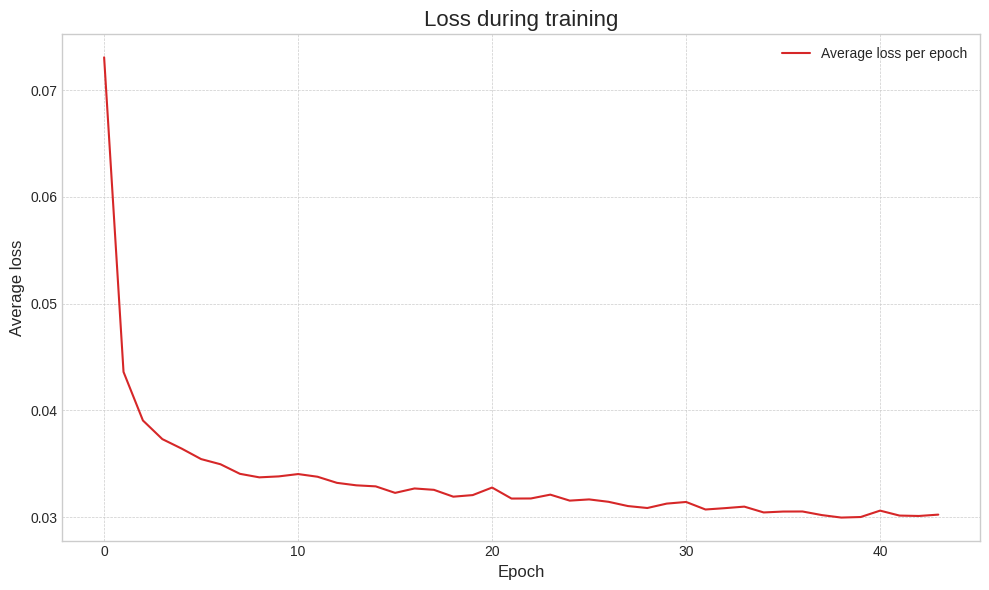

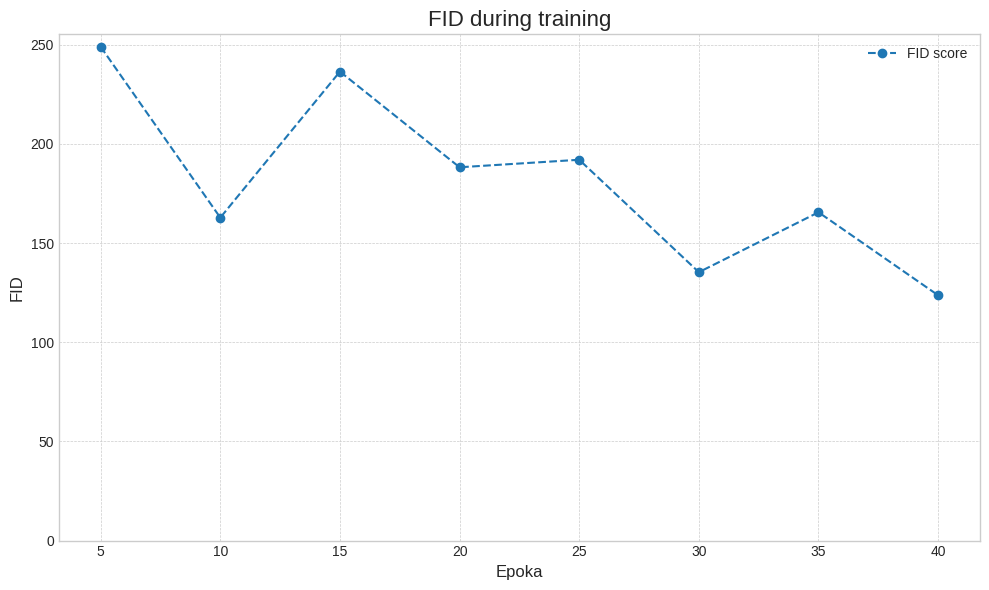

Sampling:   0%|          | 0/400 [00:00<?, ?it/s]

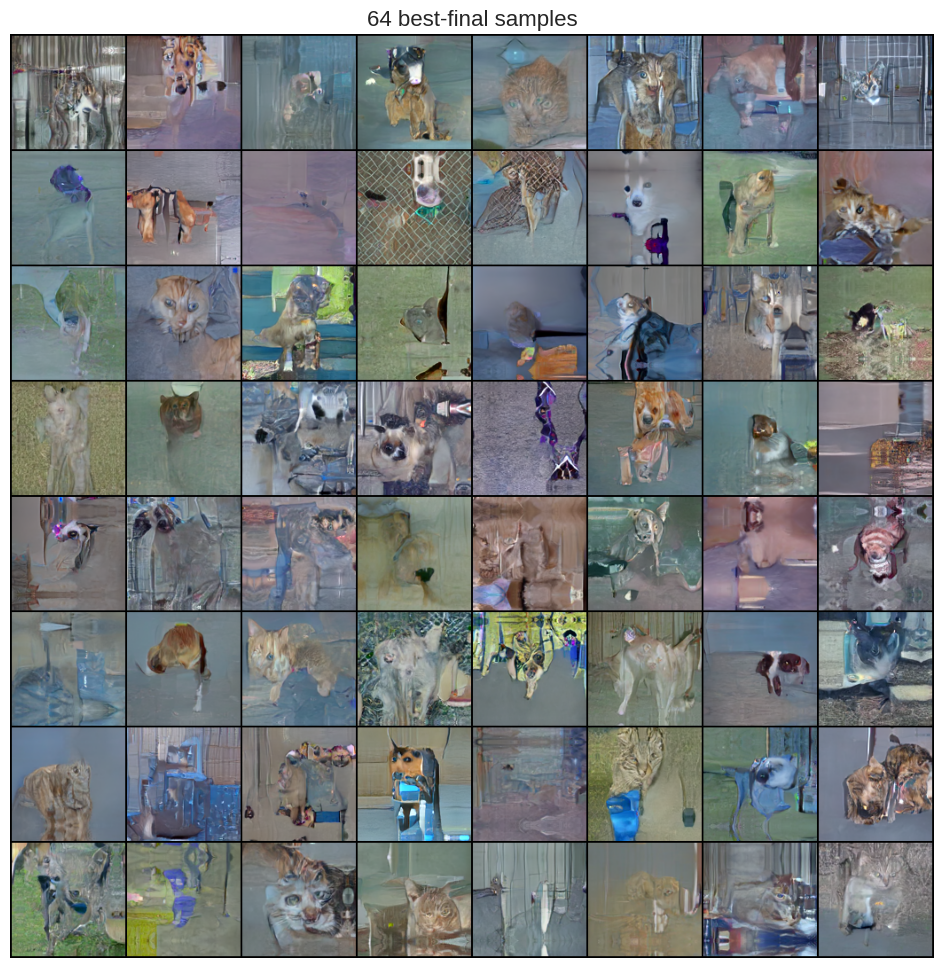

In [ ]:
# Loss curve
plt.figure(figsize=(10, 6))
plt.plot(losses, color='tab:red', label='Average loss per epoch')
plt.title('Loss during training', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Average loss', fontsize=12)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.savefig(run_directory / 'training_loss_plot.png')
plt.show()


# FID
if fid_history and fid_epochs:
    plt.figure(figsize=(10, 6))
    plt.plot(fid_epochs, fid_history, color='tab:blue', marker='o', linestyle='--', label='FID score')
    plt.title('FID during training', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('FID', fontsize=12)
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.ylim(bottom=0)
    plt.tight_layout()
    plt.savefig(run_directory / 'fid_score_plot.png')
    plt.show()


# Image grid
best_model_path = run_directory / "models" / "best_model.pth"
model.load_state_dict(torch.load(best_model_path))
model.eval()

with torch.no_grad():
    qualitative_samples = ddpm.sample((64, 3, IMAGE_SIZE, IMAGE_SIZE))
    qualitative_samples = (qualitative_samples.clamp(-1, 1) + 1) / 2
    qualitative_grid_path = run_directory / "qualitative_analysis_grid.png"
    vutils.save_image(qualitative_samples, qualitative_grid_path, nrow=8)

if qualitative_grid_path.exists():
    img = Image.open(qualitative_grid_path)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.title(f"64 best-final samples", fontsize=16)
    plt.axis('off')
    plt.show()